In [1]:
import os
os.chdir("../")
with open('run/settings.py', 'r') as file:
    exec(file.read())

Random seed set to 333
using device:  cpu


In [2]:
# (customize) configs
overwrite = False
model_name = 'air_quality' 

update_config(
    
    # Eval settings (clip)
    # ts2txt
    y_col = 'city_str',
    y_levels = ['This is air quality in Beijing.', 'This is air quality in London.'],
    y_pred_levels = ['This is air quality in Beijing.', 'This is air quality in London.'],
    # txt2ts
    txt2ts_y_cols = ['city_str', 'season_str'],# , 'year_str'
    
    
    # Data settings
    seq_length = 168,
    text_col = 'ts_description', #'ts_description',
    custom_target_cols = ['city_str', 'season_str', 'label'], # , 'year_str'
    
    
    # Model settings
    model_name = model_name,
    variational = True,
    
    # Train settings
    init_lr = 1e-4
)
config_dict = get_config_dict()


In [3]:
# change data preparation for a given experiment
with open('run/prepare_datasets/air_quality.py', 'r') as file:
    exec(file.read())
# prepare model inputs
with open('run/inputs.py', 'r') as file:
    exec(file.read())

After downsampling:
city_str
This is air quality in Beijing.    2117
This is air quality in London.      830
Name: count, dtype: int64
After downsampling:
city_str
This is air quality in Beijing.    529
This is air quality in London.     208
Name: count, dtype: int64


final distribution of text prediction
text
This is air quality in Beijing. The season is winter.    670
This is air quality in Beijing. The season is spring.    502
This is air quality in Beijing. The season is fall.      492
This is air quality in Beijing. The season is summer.    453
This is air quality in London. The season is winter.     281
This is air quality in London. The season is spring.     238
This is air quality in London. The season is fall.       167
This is air quality in London. The season is summer.     144
Name: count, dtype: int64
text
This is air quality in Beijing. The season is winter.    156
This is air quality in Beijing. The season is fall.      143
This is air quality in Beijing. The season is 

In [4]:
with open('run/model.py', 'r') as file:
    exec(file.read())


Layer (type:depth-idx)                                                      Param #
VITAL                                                                       1
├─TSVAEEncoder: 1-1                                                         --
│    └─LocalNorm: 2-1                                                       --
│    └─MultiCNNEncoder: 2-2                                                 512
│    │    └─ModuleList: 3-1                                                 518,308
│    │    └─MultiheadAttention: 3-2                                         1,050,624
│    │    └─LayerNorm: 3-3                                                  1,024
│    └─Linear: 2-3                                                          262,656
│    └─Linear: 2-4                                                          262,656
├─TextEncoder: 1-2                                                          --
│    └─TextEncoderMultiCNN: 2-5                                             512
│    │    └─ModuleLis

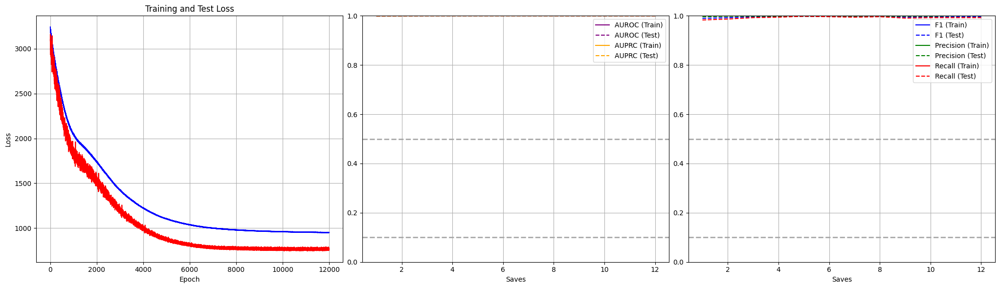

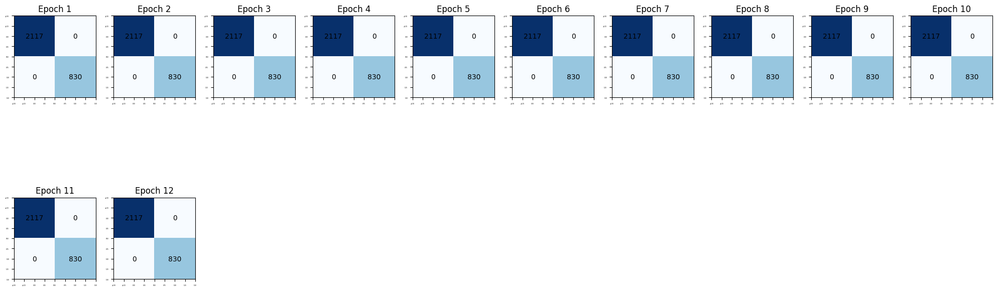

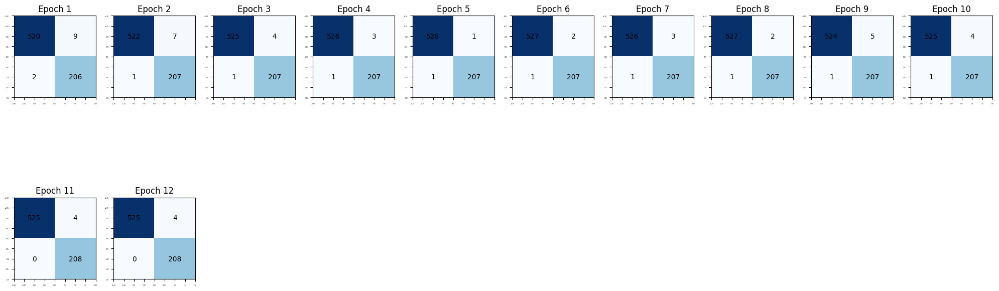

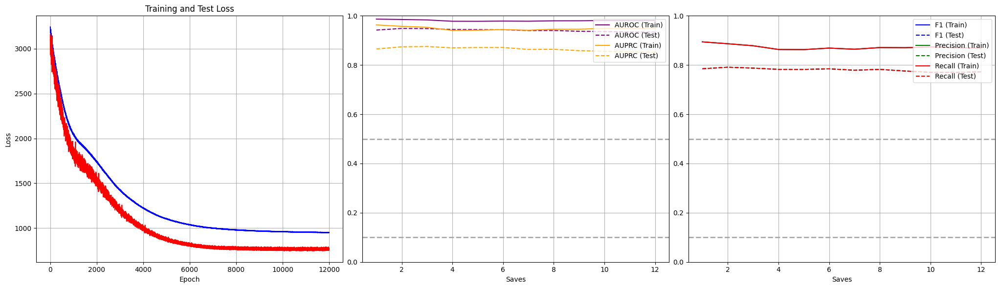

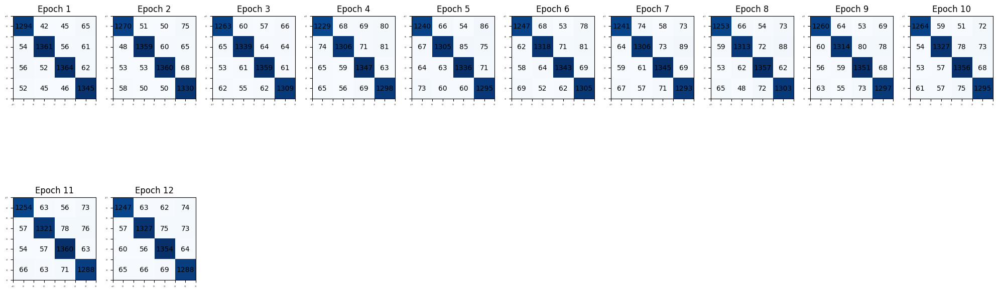

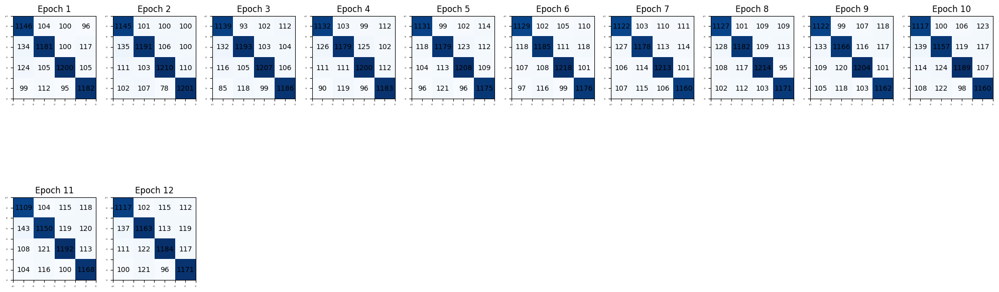

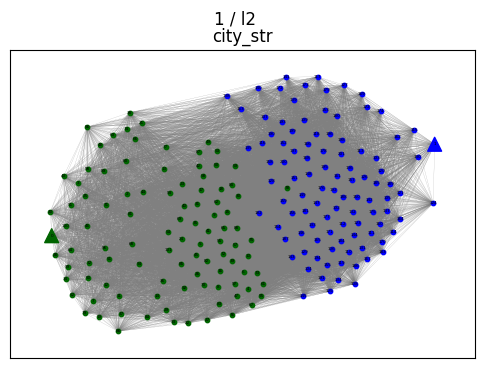

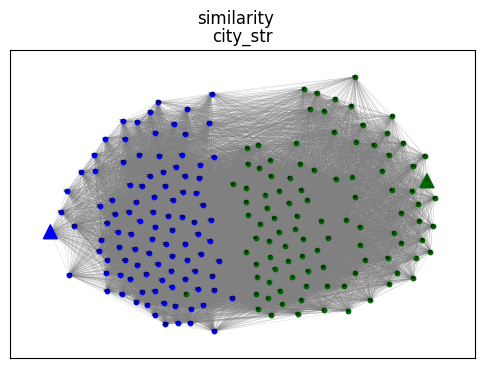

KeyboardInterrupt: 

In [5]:
# overwrite = False
with open('run/train.py', 'r') as file:
    exec(file.read())

# config_dict['train_type'] = 'clip'
# config_dict['num_saves'] = 1
# config_dict['num_epochs'] = 1000
# config_dict['init_lr'] = 1e-4
# config_dict['patience'] = 100
# with open('run/train.py', 'r') as file:
#     exec(file.read())

# for param in model.ts_encoder.parameters():
#     param.requires_grad = False
# for param in model.ts_encoder.logvar_layer.parameters():
#     param.requires_grad = True
# for param in model.text_encoder.parameters():
#     param.requires_grad = False
# print("Checking trainable parameters:")
# for name, param in model.named_parameters():
#     if param.requires_grad: print(f"{name}")

# config_dict['train_type'] = 'joint'
# config_dict['init_lr'] = 1e-4
# config_dict['num_saves'] = 10
# config_dict['num_epochs'] = 5000
# config_dict['patience'] = 200
# with open('run/train.py', 'r') as file:
#     exec(file.read())



0    This is air quality in London.
Name: city_str, dtype: object


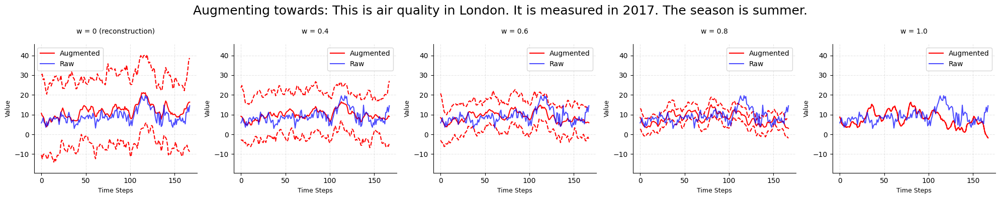

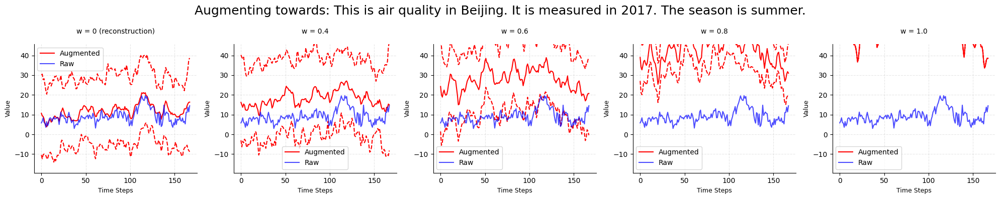

0    This is air quality in Beijing.
Name: city_str, dtype: object


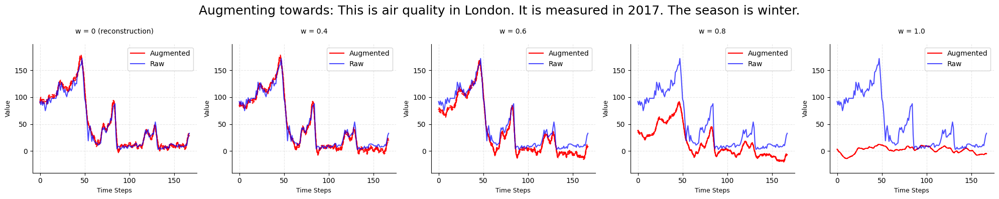

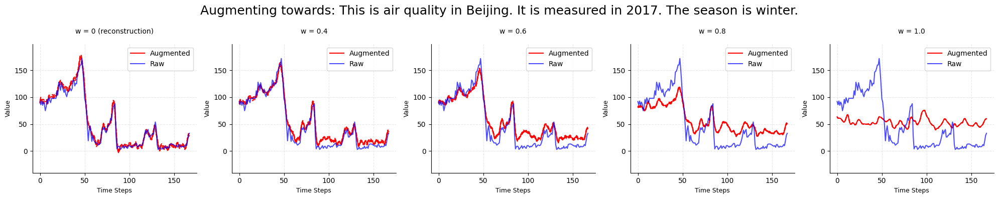

0    The season is summer.
Name: season_str, dtype: object


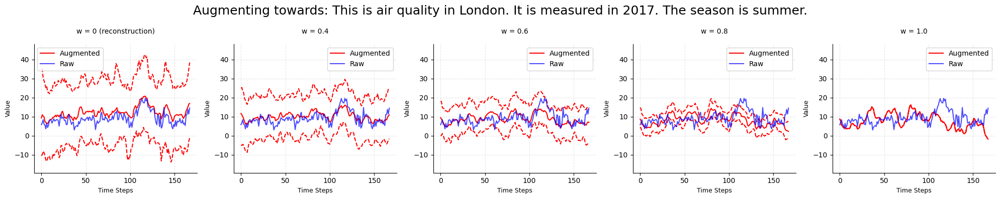

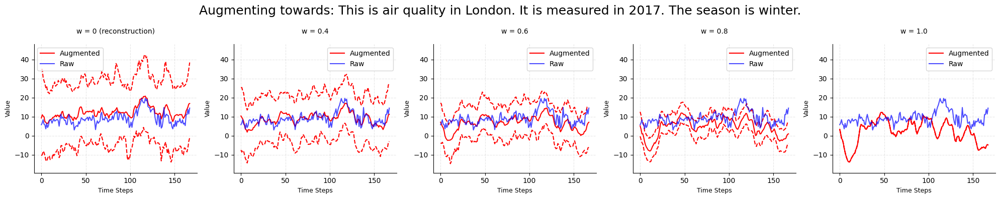

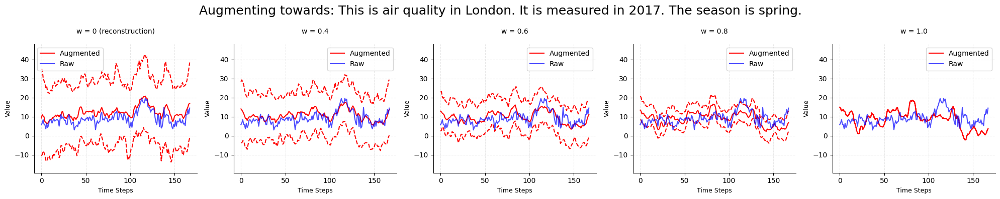

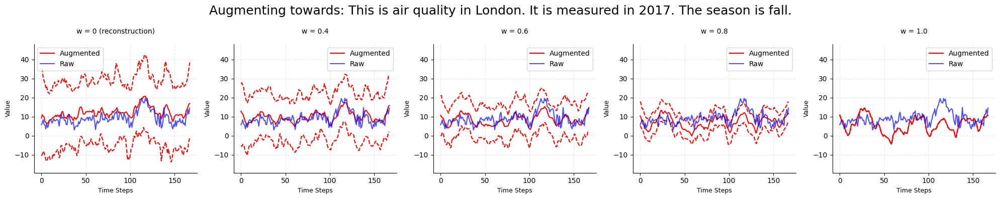

0    The season is winter.
Name: season_str, dtype: object


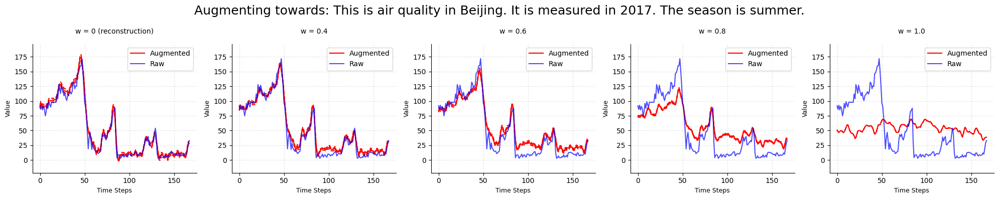

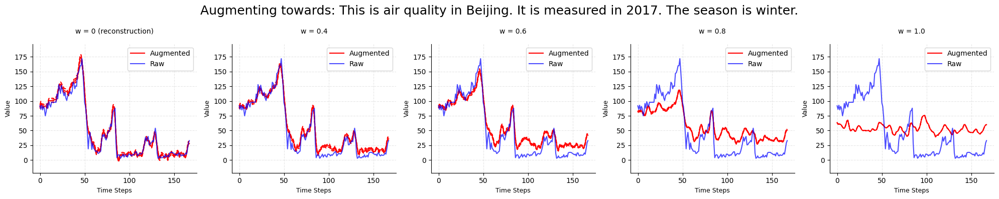

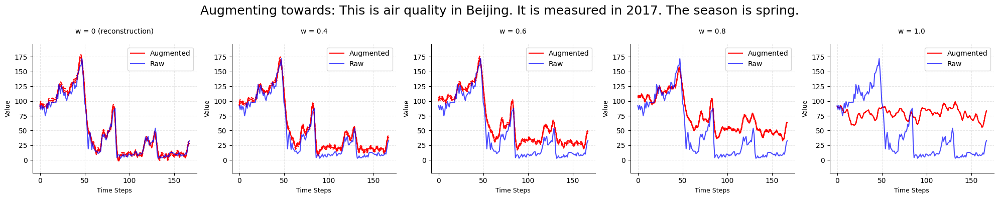

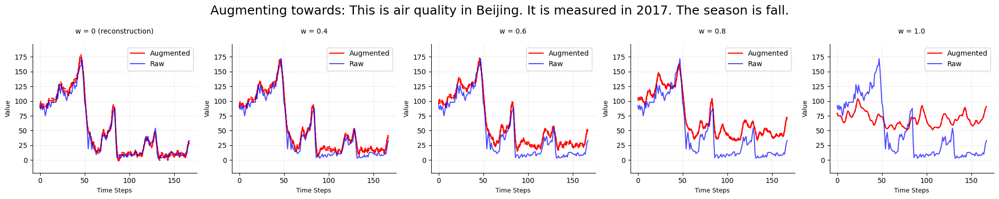

0    The season is spring.
Name: season_str, dtype: object


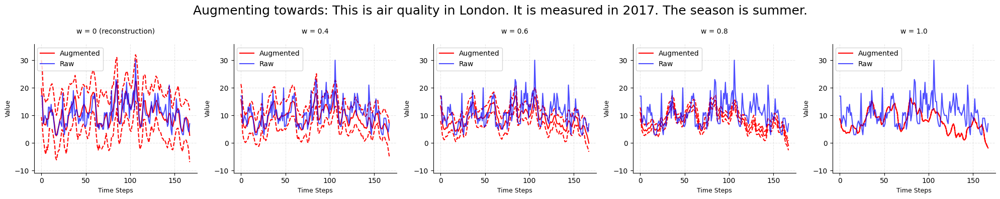

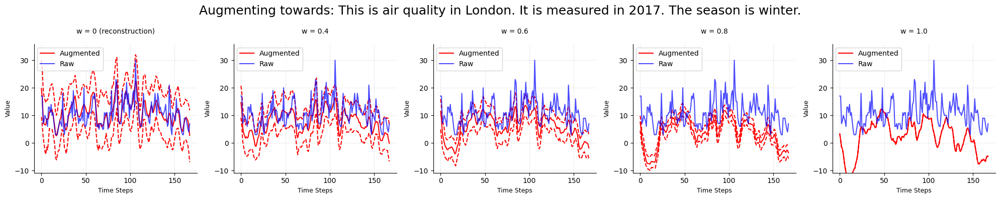

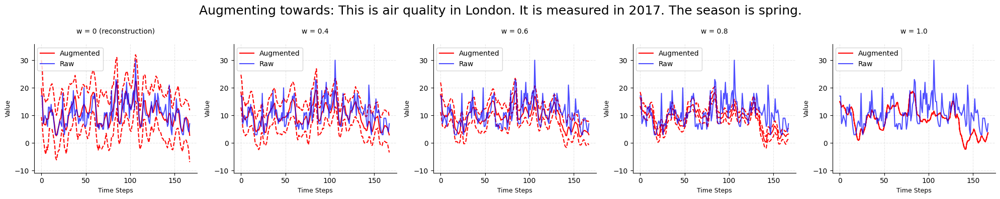

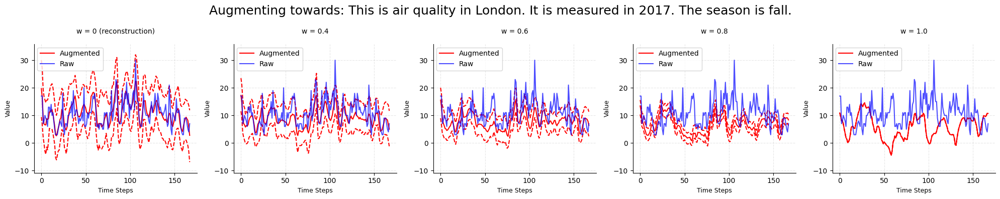

0    The season is fall.
Name: season_str, dtype: object


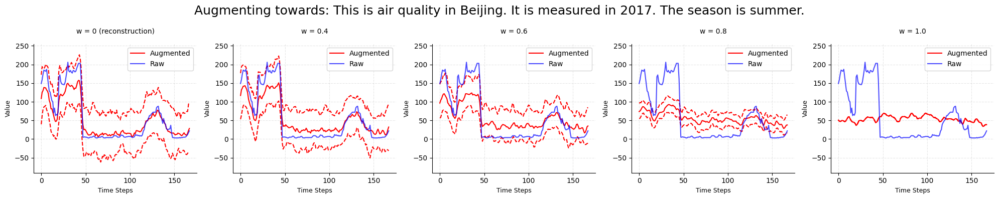

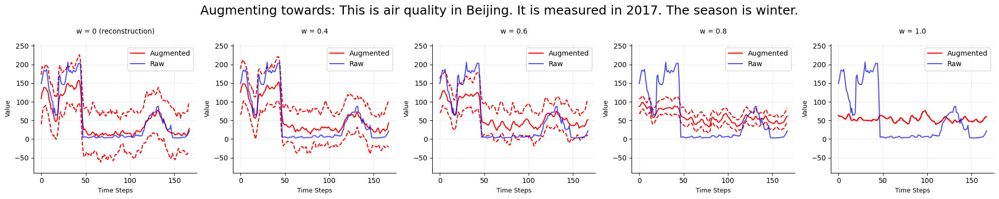

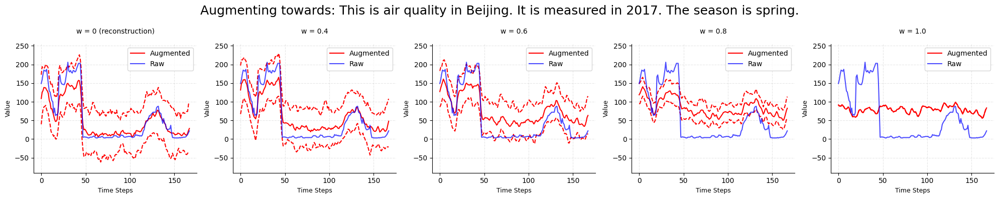

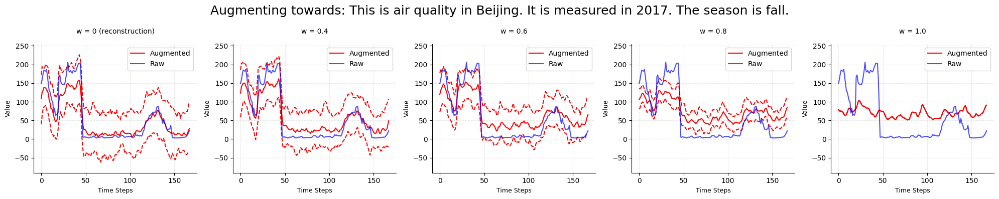

0    It is measured in 2017.
Name: year_str, dtype: object


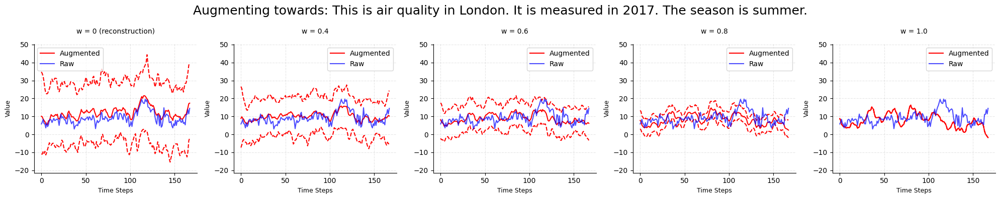

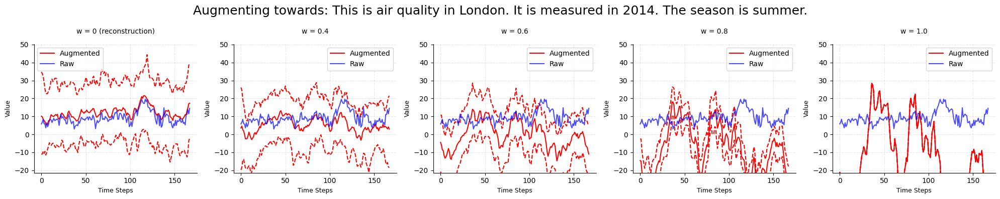

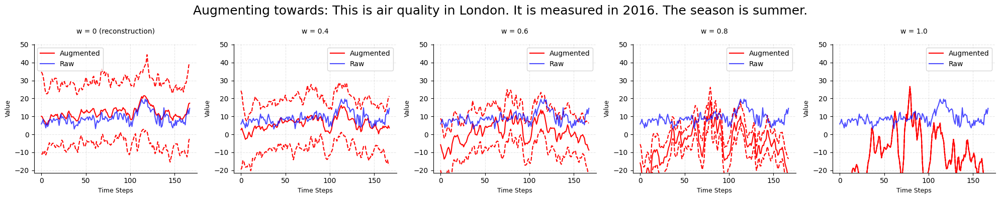

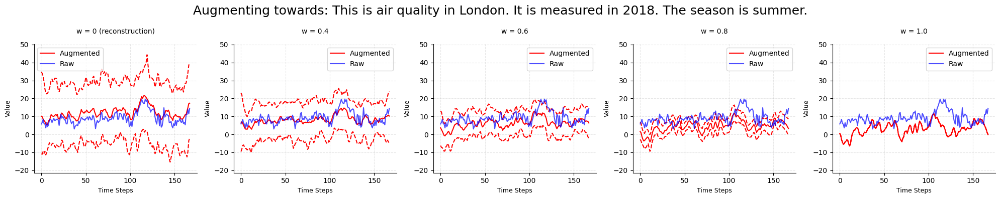

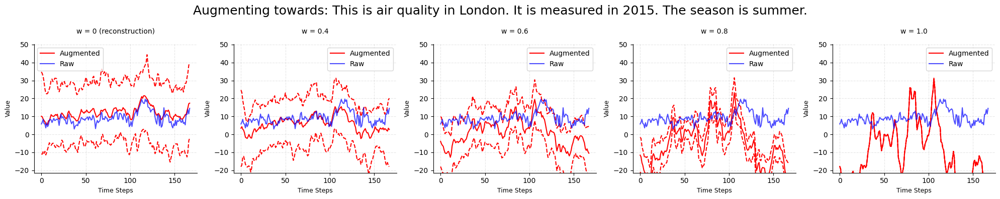

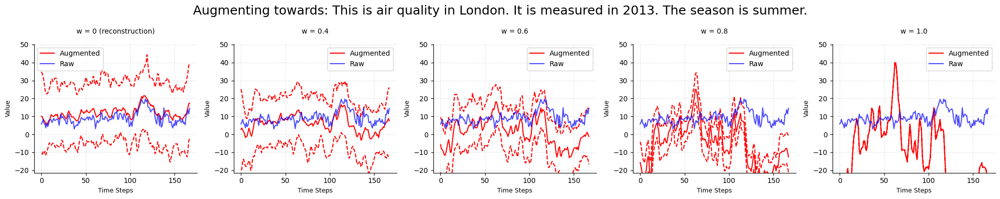

0    It is measured in 2014.
Name: year_str, dtype: object


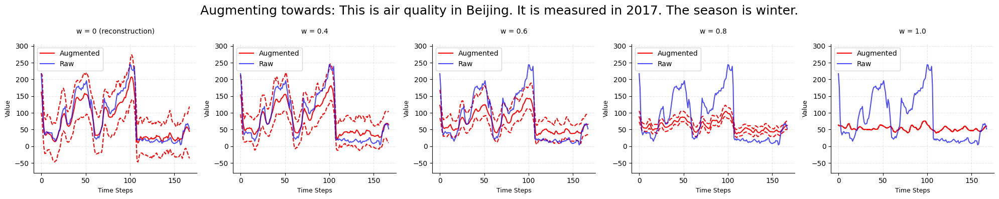

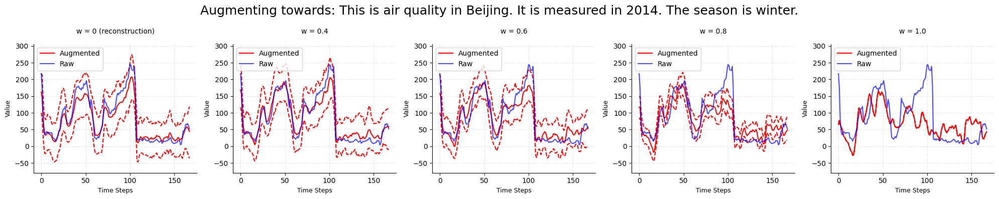

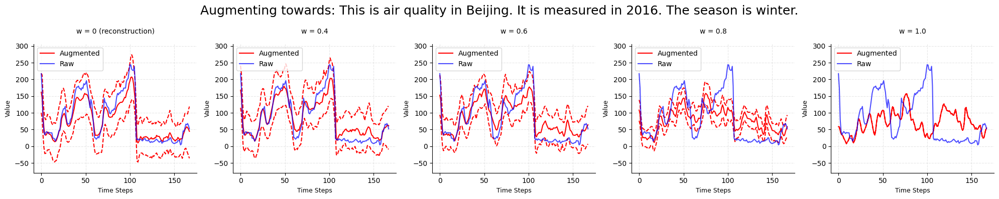

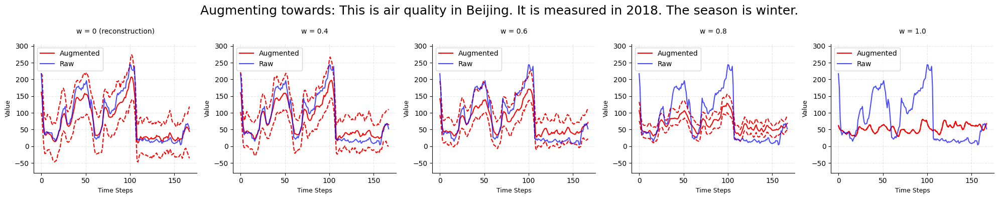

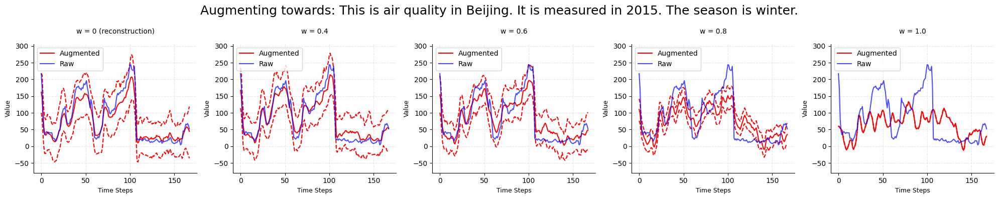

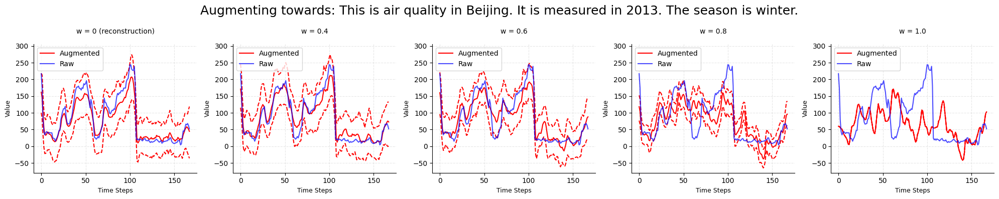

0    It is measured in 2016.
Name: year_str, dtype: object


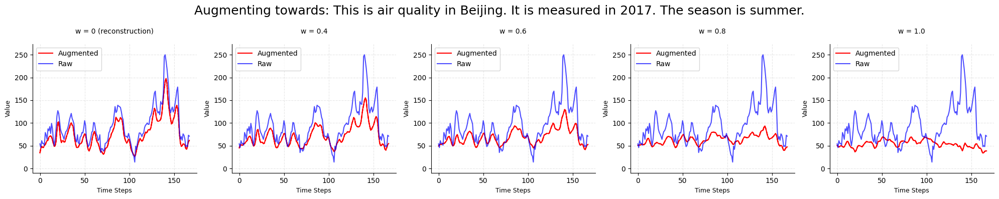

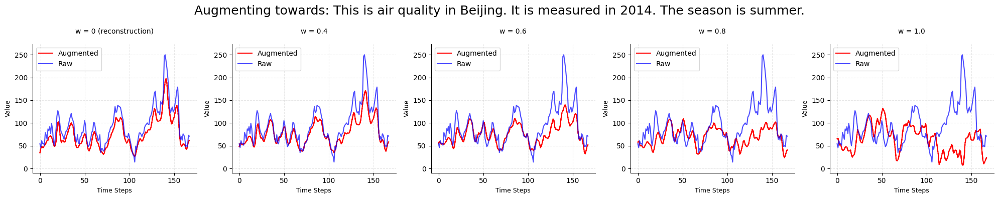

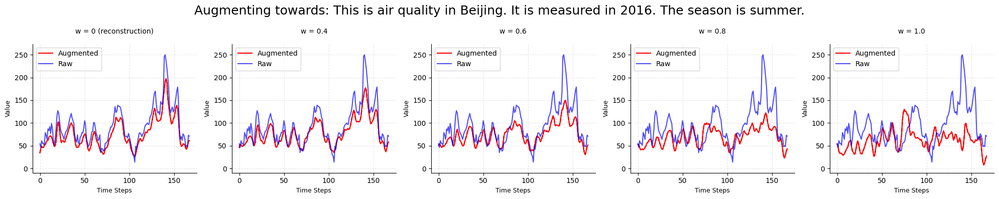

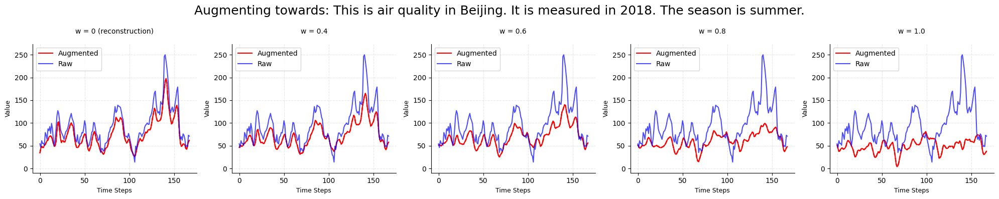

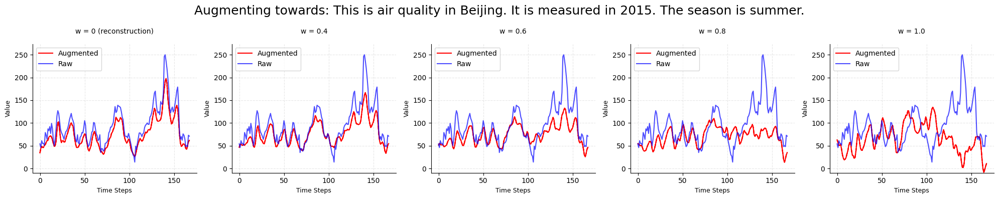

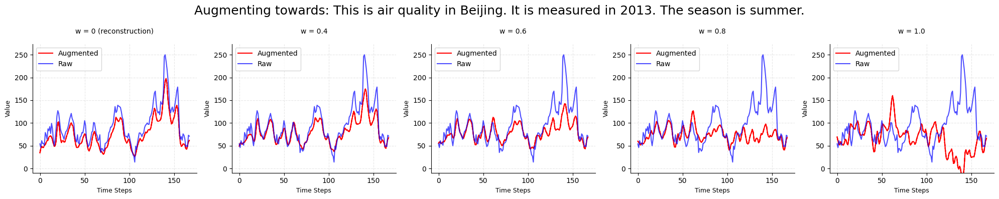

0    It is measured in 2018.
Name: year_str, dtype: object


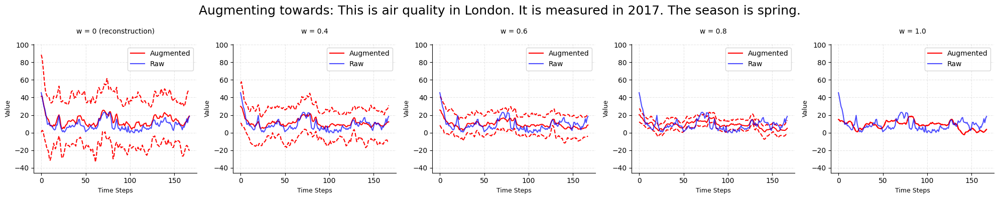

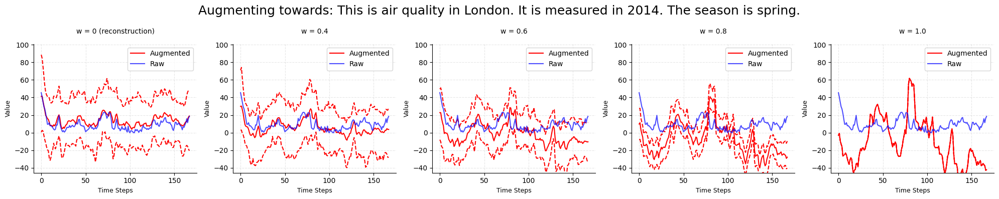

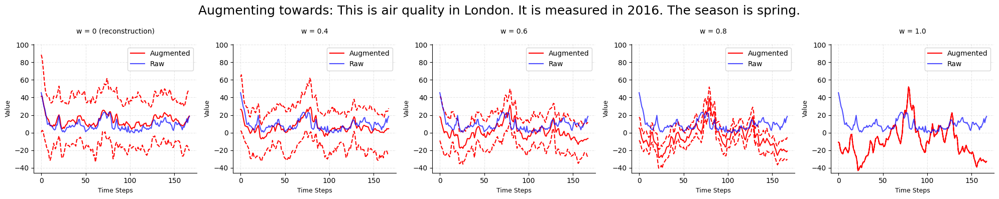

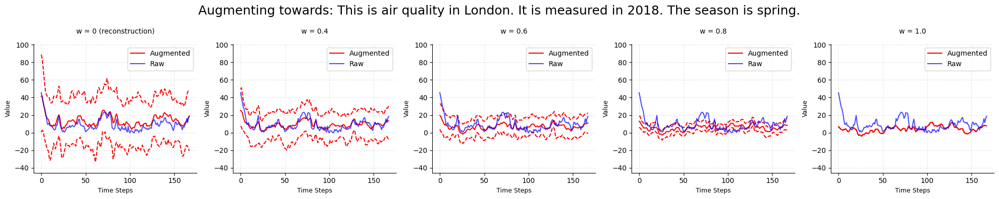

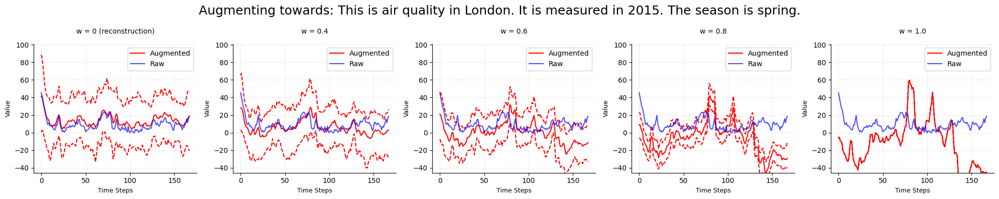

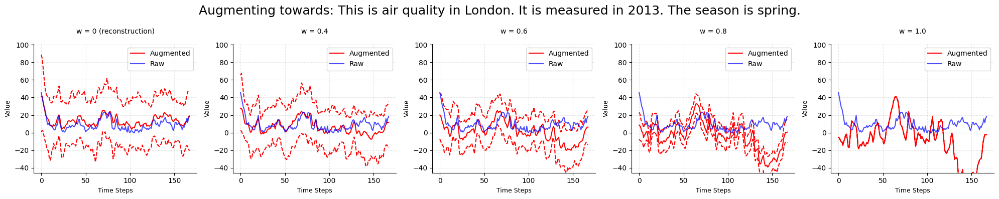

0    It is measured in 2015.
Name: year_str, dtype: object


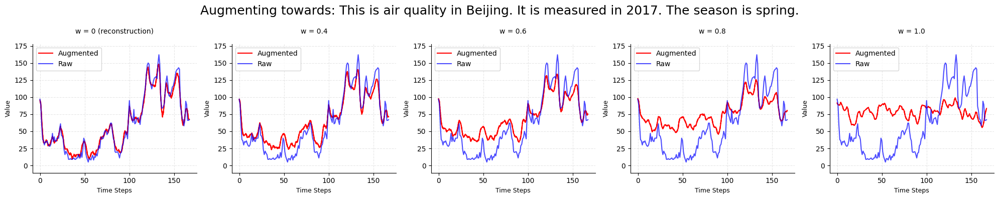

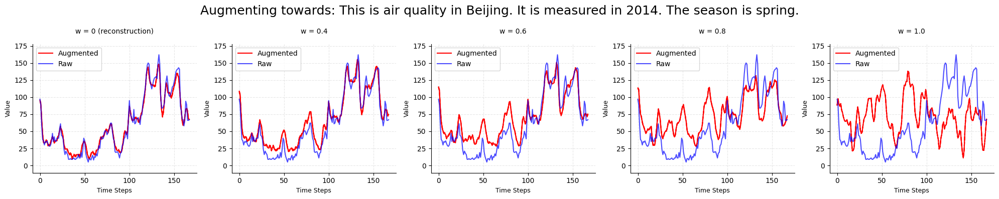

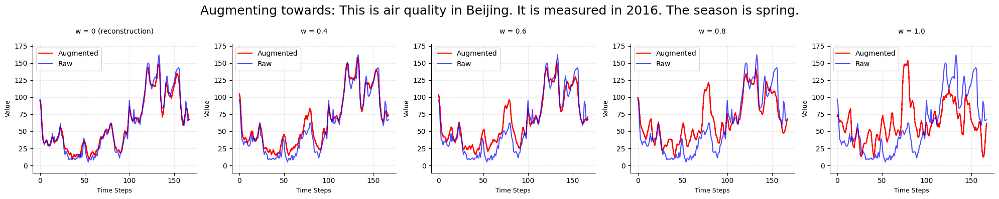

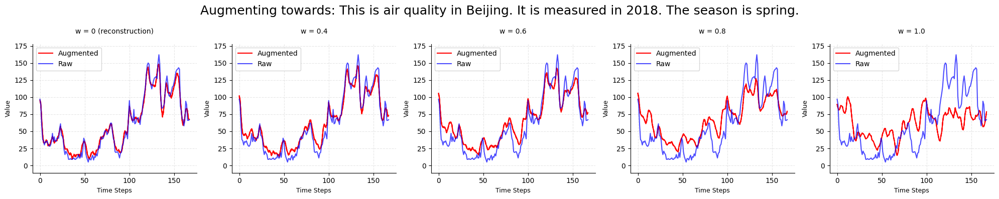

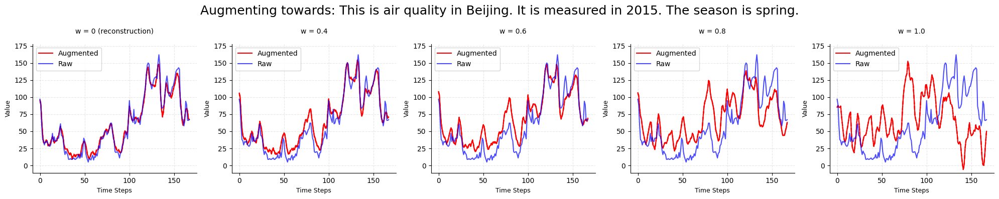

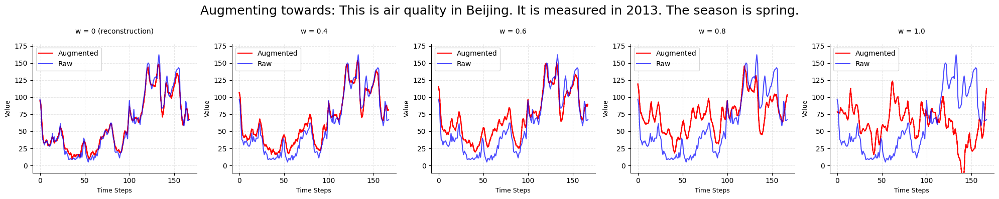

0    It is measured in 2013.
Name: year_str, dtype: object


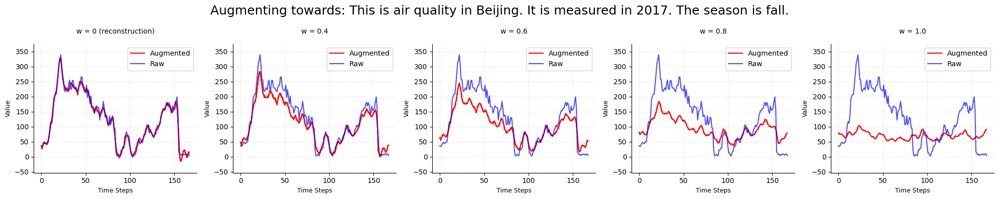

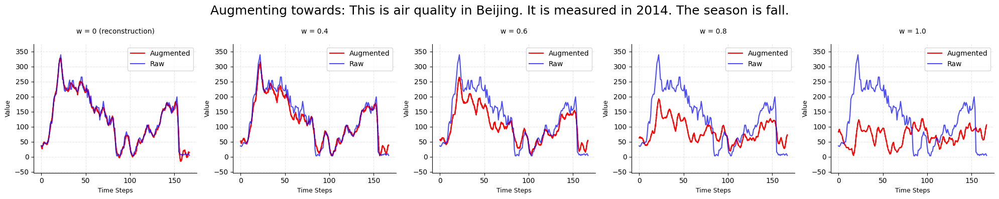

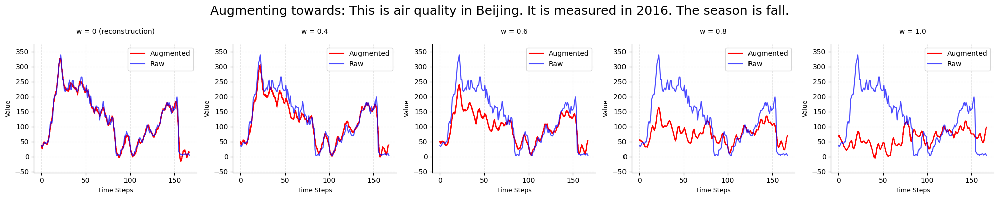

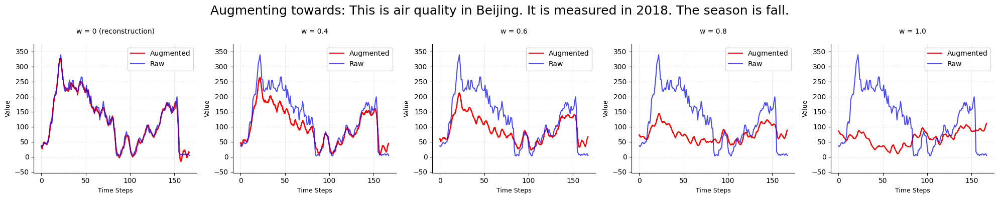

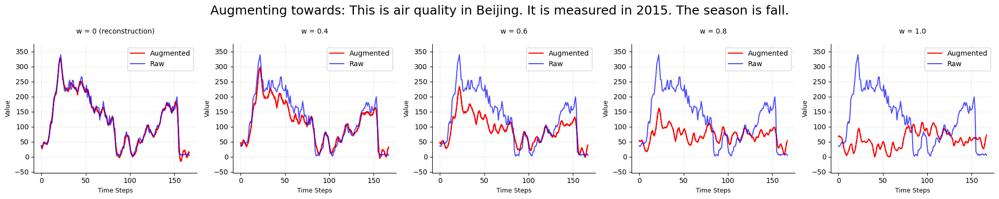

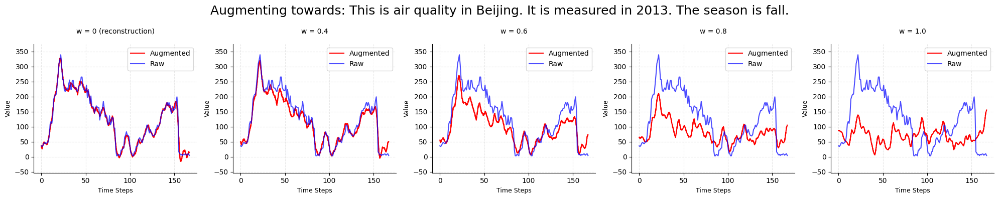

In [6]:
tid=0
# viz_generation_marginal(df_train, model, config_dict, tid=tid)
viz_generation_conditional(df_test, model, config_dict, tid=tid, sampling=True, b=100, ep=200)

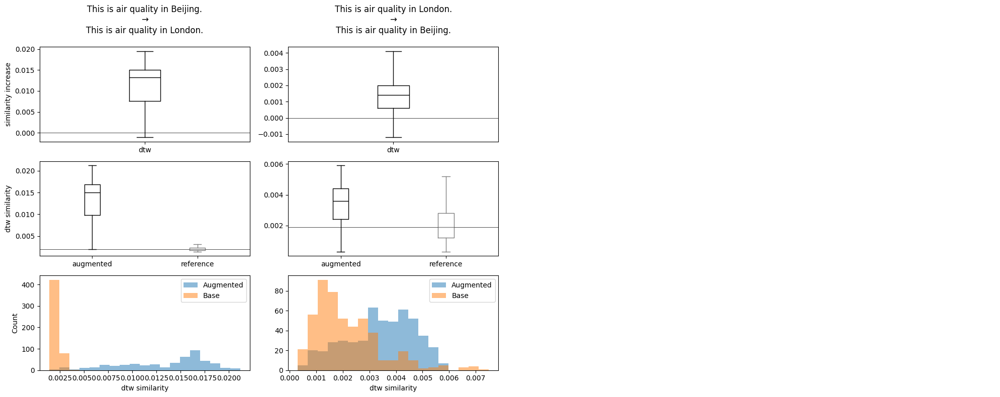

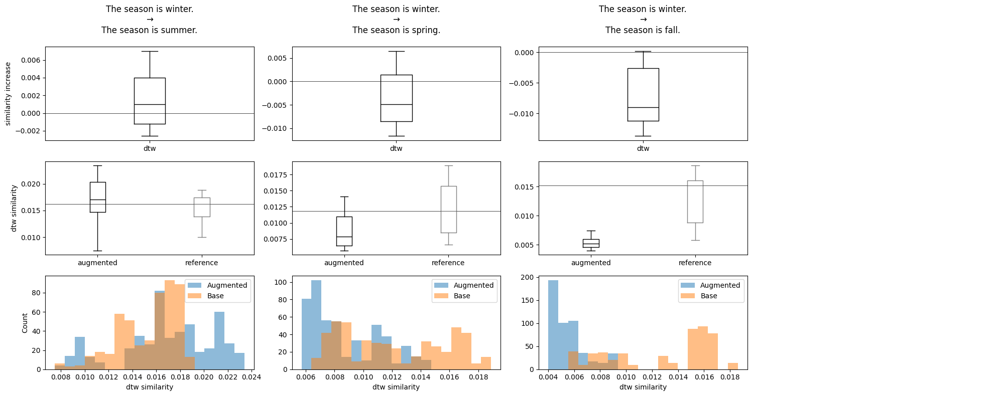

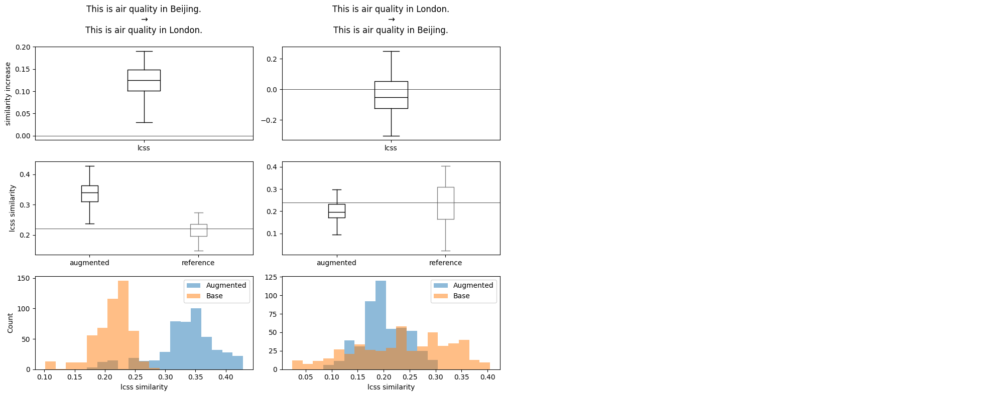

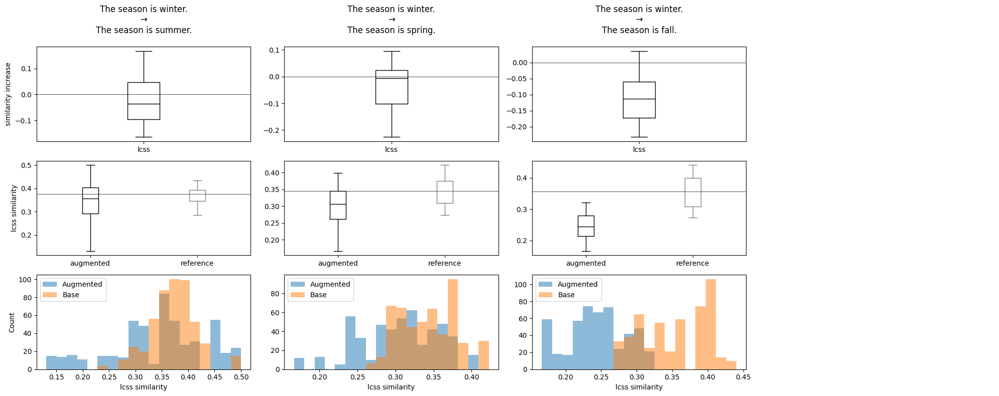

In [16]:
overwrite = False
# argument dictionary {y_col:conditions}
args0 = {'city_str': None,
        'season_str': None
        }

args1 = {'city_str': [('year_str', 'It is measured in 2017.')],
        'season_str': [('city_str', 'This is air quality in Beijing.'), ('year_str', 'It is measured in 2017.')]
        }

args2 = {'city_str': [('year_str', 'It is measured in 2017.')],
        'season_str': [('city_str', 'This is air quality in London.'), ('year_str', 'It is measured in 2017.')]
        }

args_ls = [args0, args1, args2]
filename = output_dir+'/df_dists_all.pt.gz'
if overwrite or (not os.path.exists(filename)):
    res_all = []
    for args in args_ls:
        dists_dict = {}
        for y_col in args.keys():
            print(y_col)
            df_dists = eval_ts_similarity(df_test,
                                        model, 
                                        config_dict, 
                                        w = 0.8,
                                        y_col = y_col,
                                        conditions = args[y_col],
                                        b = 500, 
                                        ths = (0, None),
                                        round_to = 0,
                                        n_patches=None)  
            dists_dict[y_col] = df_dists

        # Save using PyTorch with gzip compression
        res = {'args':args, 'dists_dict':dists_dict}
        res_all.append(res)

    buffer = io.BytesIO()
    torch.save(res_all, buffer)
    with gzip.open(filename, 'wb') as f: f.write(buffer.getvalue())
else:
    # Load compressed file
    with gzip.open(filename, 'rb') as f:
        buffer = io.BytesIO(f.read())
        res_all = torch.load(buffer, map_location=device)


# Define the base augmentation pairs
base_aug_dict = {'city_str': [('This is air quality in Beijing.', 'This is air quality in London.'), 
                            ('This is air quality in London.', 'This is air quality in Beijing.')],
                'season_str': [('The season is winter.', 'The season is summer.'),
                               ('The season is winter.', 'The season is spring.'),
                               ('The season is winter.', 'The season is fall.')]
                }
df_dists = pd.DataFrame()
for df in res_all[2]['dists_dict'].values():
    df_dists = pd.concat([df_dists, df], ignore_index=True)
# df_dists = res_all[0]['dists_dict']['segment1']
res_df = eng_dists_multiple(df_dists, base_aug_dict, metric = 'dtw')
res_df = eng_dists_multiple(df_dists, base_aug_dict, metric = 'lcss')

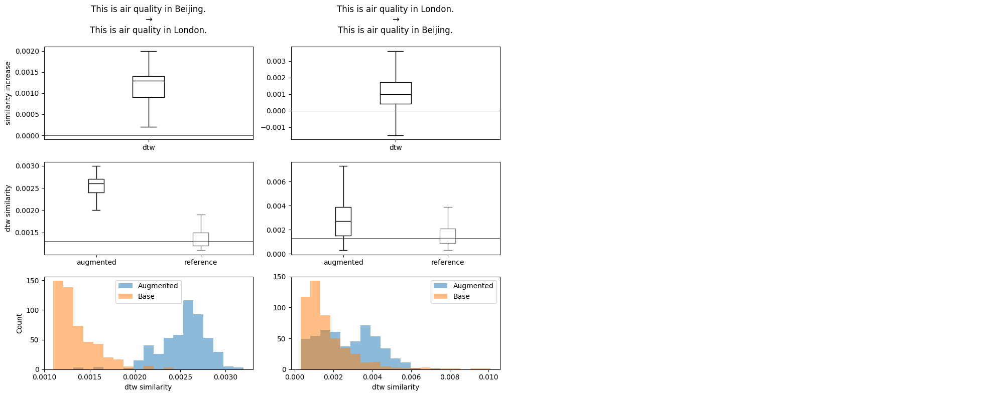

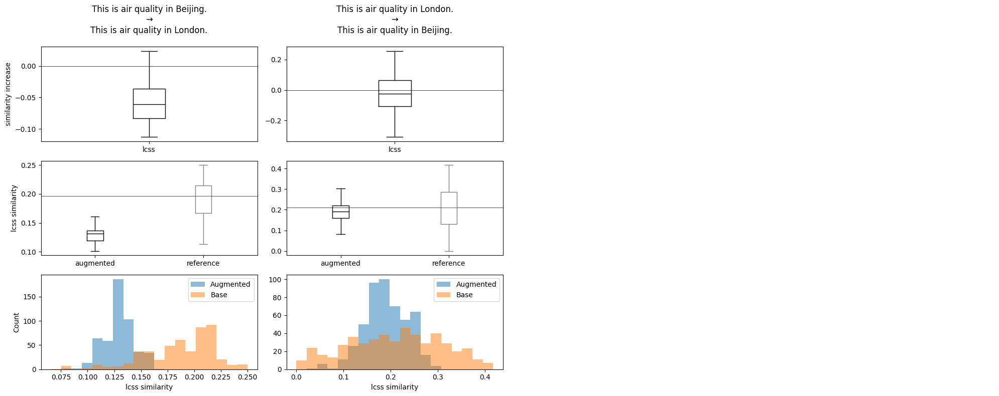

In [8]:
overwrite = False
# argument dictionary {y_col:conditions}
args0 = {'city_str': None}

args_ls = [args0]
filename = output_dir+'/df_dists_all_tmp.pt.gz'
if overwrite or (not os.path.exists(filename)):
    res_all = []
    for args in args_ls:
        dists_dict = {}
        for y_col in args.keys():
            print(y_col)
            df_dists = eval_ts_similarity(df_test,
                                        model, 
                                        config_dict, 
                                        w = 0.8,
                                        y_col = y_col,
                                        conditions = args[y_col],
                                        b = 500, 
                                        round_to = 0,
                                        n_patches=None)  
            dists_dict[y_col] = df_dists

        # Save using PyTorch with gzip compression
        res = {'args':args, 'dists_dict':dists_dict}
        res_all.append(res)

    buffer = io.BytesIO()
    torch.save(res_all, buffer)
    with gzip.open(filename, 'wb') as f: f.write(buffer.getvalue())
else:
    # Load compressed file
    with gzip.open(filename, 'rb') as f:
        buffer = io.BytesIO(f.read())
        res_all = torch.load(buffer, map_location=device)


# Define the base augmentation pairs
base_aug_dict = {'city_str': [('This is air quality in Beijing.', 'This is air quality in London.'), 
                            ('This is air quality in London.', 'This is air quality in Beijing.')],
                # 'season_str': [('The season is winter.', 'The season is summer.'),
                #                ('The season is winter.', 'The season is spring.'),
                #                ('The season is winter.', 'The season is fall.')]
                }
df_dists = pd.DataFrame()
for df in res_all[0]['dists_dict'].values():
    df_dists = pd.concat([df_dists, df], ignore_index=True)
# df_dists = res_all[0]['dists_dict']['segment1']
res_df = eng_dists_multiple(df_dists, base_aug_dict, metric = 'dtw')
res_df = eng_dists_multiple(df_dists, base_aug_dict, metric = 'lcss')